In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# !sudo apt-get install -y fonts-nanum
# !sudo fc-cache -fv
# !rm ~/.cache/matplotlib -rf

# Load Dataset

In [3]:
import os
import random
import numpy as np
import pandas as pd
import math
from pandas import datetime
from tqdm.auto import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from pylab import rcParams
plt.rc('font',family='NanumBarunGothic')
plt.rc('axes', unicode_minus=False) # 한글폰트를 사용하며 마이너스폰트가 깨져 이렇게 설정
from IPython.display import set_matplotlib_formats
%config InlineBackend.figure_format = 'retina' # 폰트 선명하게 보이기 위해

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, RobustScaler, MaxAbsScaler, Normalizer,MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
# from catboost import CatBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import StackingRegressor

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42)

import sys
import warnings
warnings.filterwarnings('ignore')

<ipython-input-3-76af426d9ca0>:6: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


In [4]:
train = pd.read_csv('/content/drive/MyDrive/DACON/Car_accident/train.csv').drop(columns='ID')
test = pd.read_csv('/content/drive/MyDrive/DACON/Car_accident/test.csv').drop(columns='ID')
countrywide_accidient = pd.read_csv('/content/drive/MyDrive/DACON/Car_accident/external_open/countrywide_accident.csv').drop(columns='ID') # 대구를 제외한 전국에서 발생한 교통사고 데이터 602775
# cctv = pd.read_csv('/content/drive/MyDrive/DACON/Car_accident/external_open/대구 CCTV 정보.csv', encoding='euc-kr') # 대구에 존재하는 CCTV 관련 정보
light = pd.read_csv('/content/drive/MyDrive/DACON/Car_accident/external_open/대구 보안등 정보.csv', encoding='euc-kr') # 대구에 존재하는 보안등 관련 정보
# child = pd.read_csv('/content/drive/MyDrive/DACON/Car_accident/external_open/대구 어린이 보호 구역 정보.csv', encoding='euc-kr') # 대구에 존재하는 어린이 보호 구역 관련 정보
# cargo = pd.read_csv('/content/drive/MyDrive/DACON/Car_accident/external_open/대구 주차장 정보.csv', encoding='euc-kr') # 대구에 존재하는 주차장 관련 정보

# Feature engineering

In [5]:
def process_data(df, time_pattern=r'(\d{4})-(\d{1,2})-(\d{1,2}) (\d{1,2})', location_pattern=r'(\S+) (\S+) (\S+)', road_pattern=r'(.+) - (.+)'):
    df_copy = df.copy()

    # Extracting time information
    df_copy[['연', '월', '일', '시간']] = df_copy['사고일시'].str.extract(time_pattern)
    df_copy[['연', '월', '일', '시간']] = df_copy[['연', '월', '일', '시간']].apply(pd.to_numeric)
    df_copy = df_copy.drop(columns=['사고일시'])

    # Extracting location information
    df_copy[['도시', '구', '동']] = df_copy['시군구'].str.extract(location_pattern)
    df_copy = df_copy.drop(columns=['시군구', '도시'])

    # Extracting road information
    df_copy[['도로형태1', '도로형태2']] = df_copy['도로형태'].str.extract(road_pattern)
    df_copy = df_copy.drop(columns=['도로형태'])

    return df_copy

# Applying the function to your dataframes
train_df = process_data(train)
test_df = process_data(test)
ca_df = process_data(countrywide_accidient)

In [6]:
# '도로형태1'이 '기타'이고 '도로형태2'가 '기타'인 경우 '기타1'로 변경
train_df.loc[(train_df['도로형태1'] == '기타') & (train_df['도로형태2'] == '기타'), '도로형태2'] = '기타1'

# '도로형태1'이 '단일로'이고 '도로형태2'가 '기타'인 경우 '기타2'로 변경
train_df.loc[(train_df['도로형태1'] == '단일로') & (train_df['도로형태2'] == '기타'), '도로형태2'] = '기타2'

In [7]:
# null_count = train_df.isnull().sum()
# null_count

# 수치형과 범주형 데이터들 전체적인 EDA

In [8]:
def histplot(data):
    cols = data.columns

    num_rows = math.ceil(len(cols) / 4)  # 그리드 행 개수 계산
    fig, ax = plt.subplots(ncols=4, nrows=num_rows, figsize=(15, 4 * num_rows))
    ax = ax.flatten()
    fig.subplots_adjust(hspace=0.5, wspace=0.3)

    for i, col in enumerate(cols):
        sns.histplot(data=data, x=col, kde=True, color='green', ax=ax[i])
        ax[i].set_title(col)
        ax[i].set_xlabel('')

        # x축 레이블 회전 설정
        ax[i].tick_params(axis='x', labelrotation=45)

        if i % 4 != 0:
            ax[i].set_ylabel('')
        else:
            ax[i].set_ylabel('빈도')

    # 빈 서브플롯은 숨기기
    for j in range(i + 1, len(ax)):
        ax[j].axis('off')

    fig.suptitle('히스토그램', fontsize=20, weight='bold')
    plt.show()

In [ ]:
num_df = train_df[['사망자수', '중상자수', '경상자수', '부상자수', 'ECLO', '월', '일', '시간']]
obj_df = train_df[['요일', '기상상태', '노면상태', '사고유형', '사고유형 - 세부분류', '법규위반', '가해운전자 차종',
       '가해운전자 성별', '가해운전자 연령', '가해운전자 상해정도', '피해운전자 차종', '피해운전자 성별',
       '피해운전자 연령', '피해운전자 상해정도', '구', '동', '도로형태1', '도로형태2']]

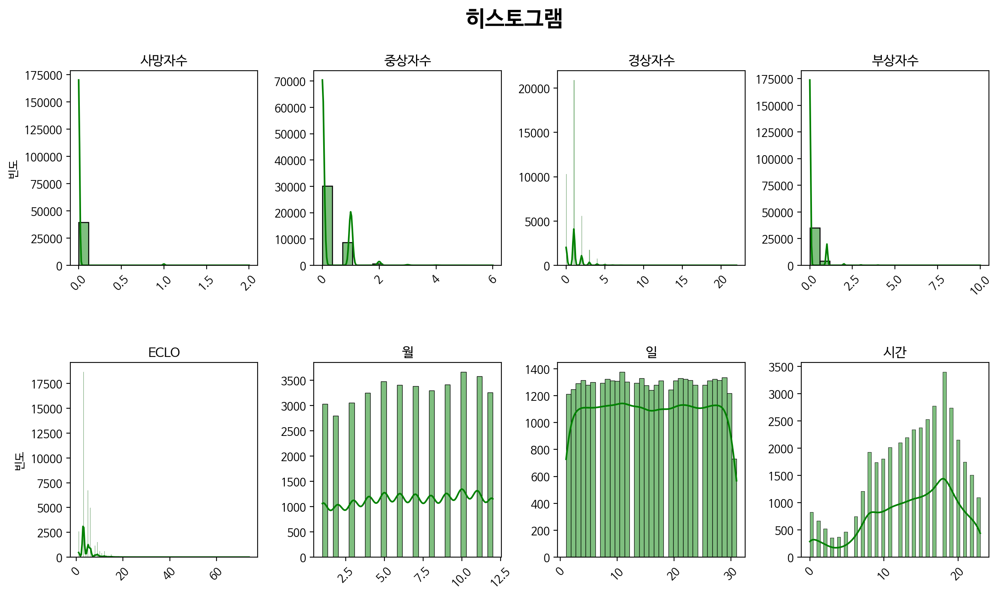

In [ ]:
histplot(num_df)

* 2월이 가장 사고가 적었고, 새벽시간에 사고가 덜 발생하며, 퇴근시간대에 급격히 늘어난다.

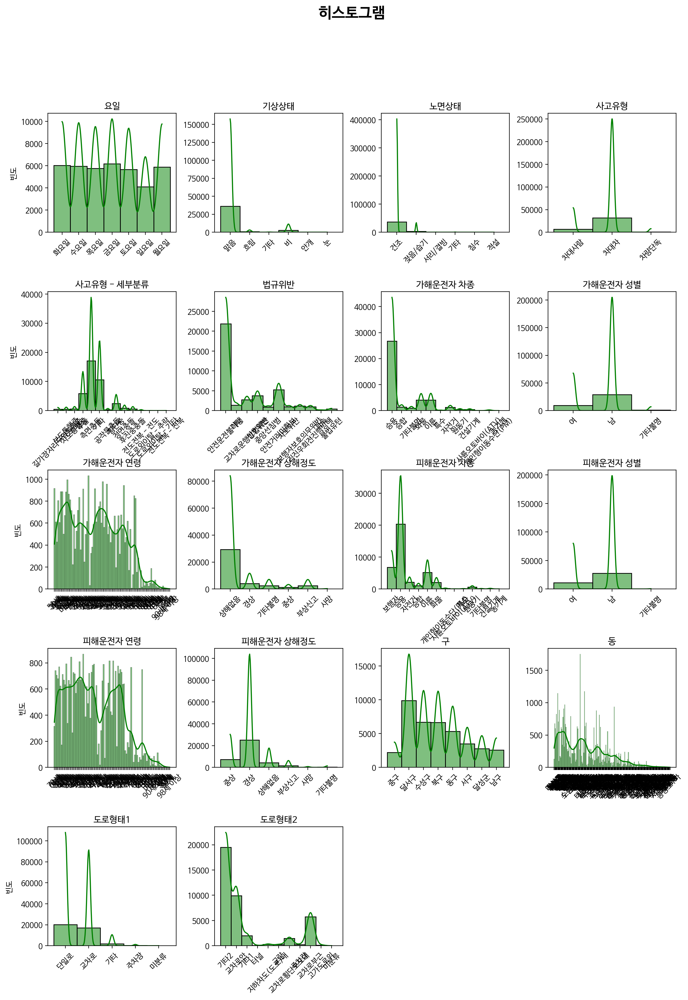

In [ ]:
histplot(obj_df)

* 일요일에 사고가 가장 적게 발생한다.
* 측면충돌이 다수이다.(그다음으로 기타, 추돌) -> 옆에서 박았다는건데, 도로형태로 가설을 세워보자.



# 각 Feature별로 ECLO와 어떤 양상이 있는가?

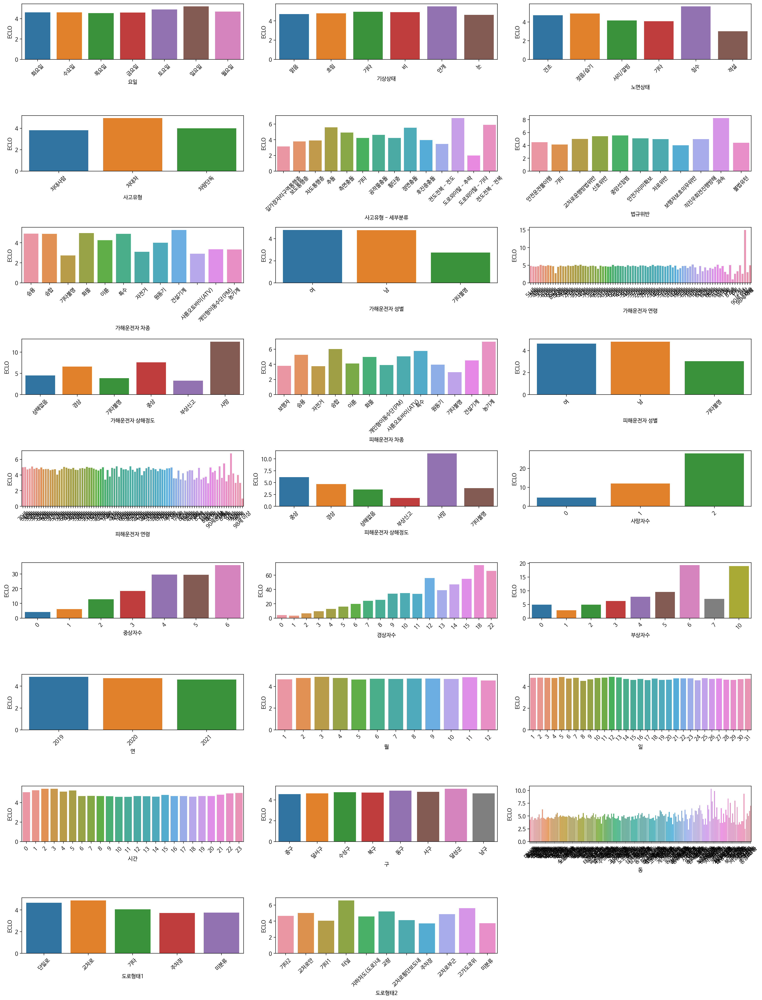

In [9]:
i = 0
plt.figure(figsize=(20,26))
for col in ['요일', '기상상태', '노면상태', '사고유형', '사고유형 - 세부분류', '법규위반', '가해운전자 차종',
       '가해운전자 성별', '가해운전자 연령', '가해운전자 상해정도', '피해운전자 차종', '피해운전자 성별',
       '피해운전자 연령', '피해운전자 상해정도', '사망자수', '중상자수', '경상자수', '부상자수', '연', '월',
       '일', '시간', '구', '동', '도로형태1', '도로형태2']:
    i += 1
    plt.subplot(9,3,i)
    sns.barplot(x=train_df[col], y=train_df['ECLO'],ci=None)
    plt.xticks(rotation=45)
plt.tight_layout()

* 토, 일에 ECLO 높다. -> 주말 피처를 만들어?
* 안개(8개)낄때 ECLO가 놓다. 다만 test에는 안개 데이터가 없음.
* 침수(노면상태)에서 가장 높다.
* 과속시 ECLO가 큰 것으로 봐서, 중대한 사고가 발생하는듯 -> 과속이 많이 발생하는 곳(구, 동)에 CCTV 설치가 많은지를 확인해볼까? 113개뿐임
* ECLO가 압도적으로 높은 가해자 연령대(98세 이상으로 집계)가 있다. -> 경우가 1개임
* 새벽시간에 ECLO가 높은걸 보니 그때 큰 사고가 많이 난듯




# 결측값이 991개 정도 있는데, 이에 대해 살펴보자

In [ ]:
missing_df = train_df[train_df['피해운전자 연령'].isnull()]

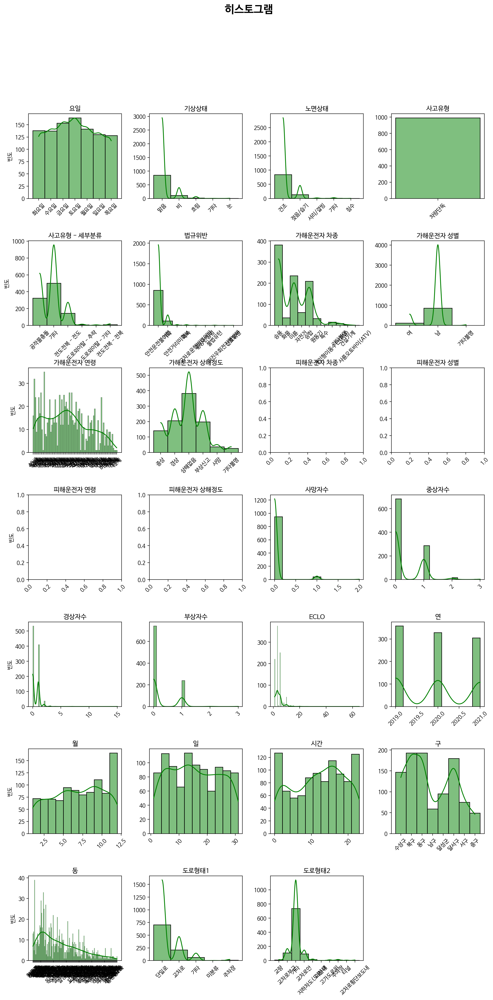

In [ ]:
histplot(missing_df)

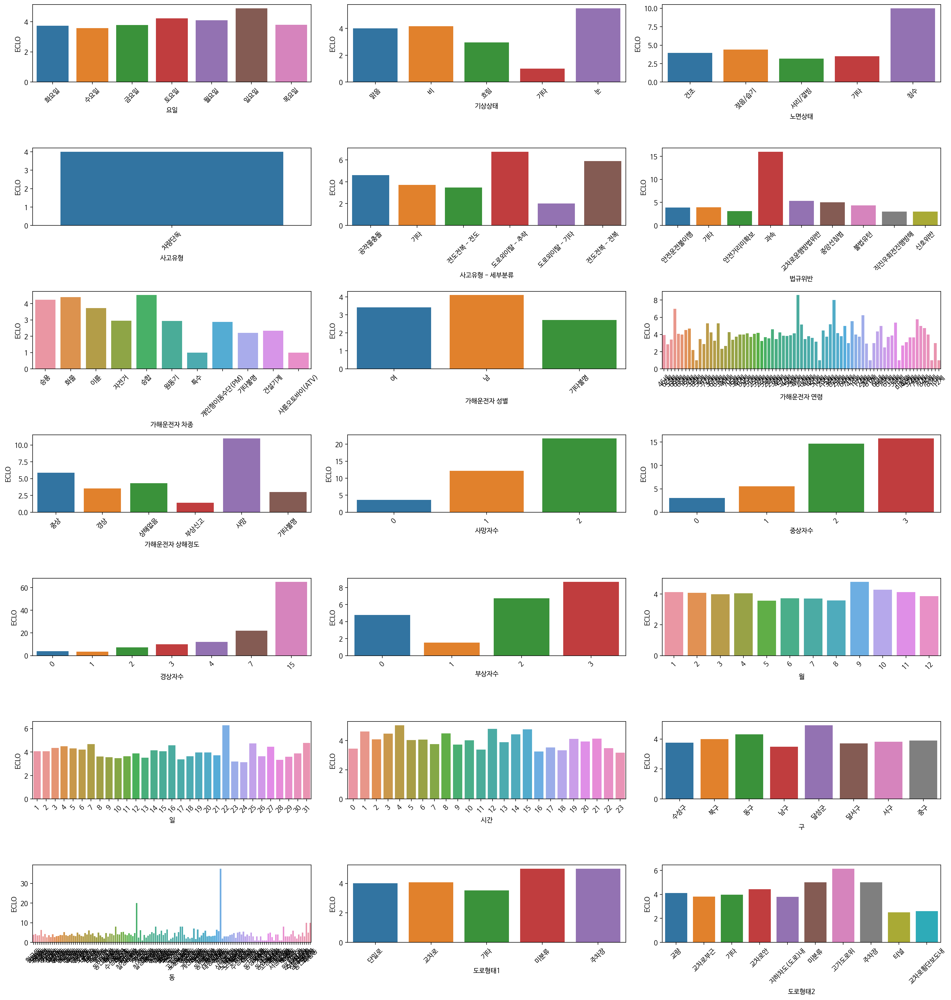

In [ ]:
i = 0
plt.figure(figsize=(20,26))
for col in ['요일', '기상상태', '노면상태', '사고유형', '사고유형 - 세부분류', '법규위반', '가해운전자 차종',
       '가해운전자 성별', '가해운전자 연령', '가해운전자 상해정도', '사망자수', '중상자수', '경상자수', '부상자수', '월',
       '일', '시간', '구', '동', '도로형태1', '도로형태2']:
    i += 1
    plt.subplot(9,3,i)
    sns.barplot(x=missing_df[col], y=train_df['ECLO'],ci=None)
    plt.xticks(rotation=45)
plt.tight_layout()

* 피해운전자 정보에 대해 결측값인 경우 사고 유형은 모두 차량단독사고다. -> 즉 피해자 없이 단독적으로 사고를 낸 경우

# 1. 지역
* 지역(구, 동)과 도로형태에서 어떤 insight를 도출할 수 있을지, 그리고 기상상태, 도로형태, 노면상태에 따라 어떤 변화가 있을지 보자

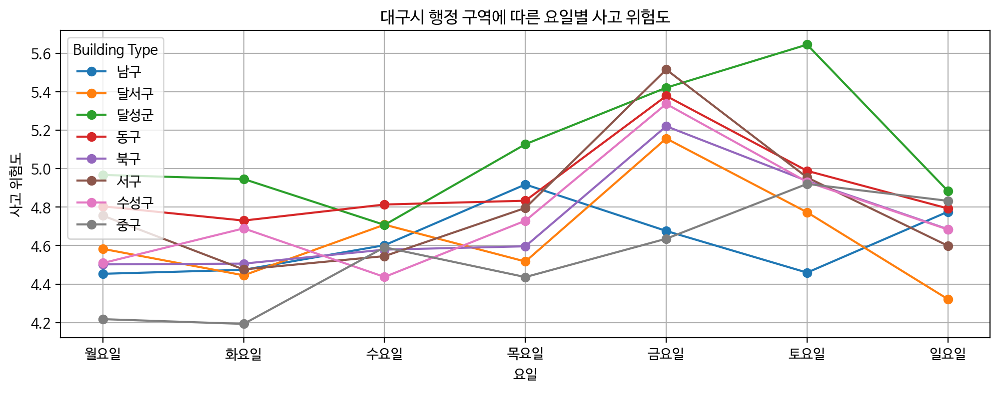

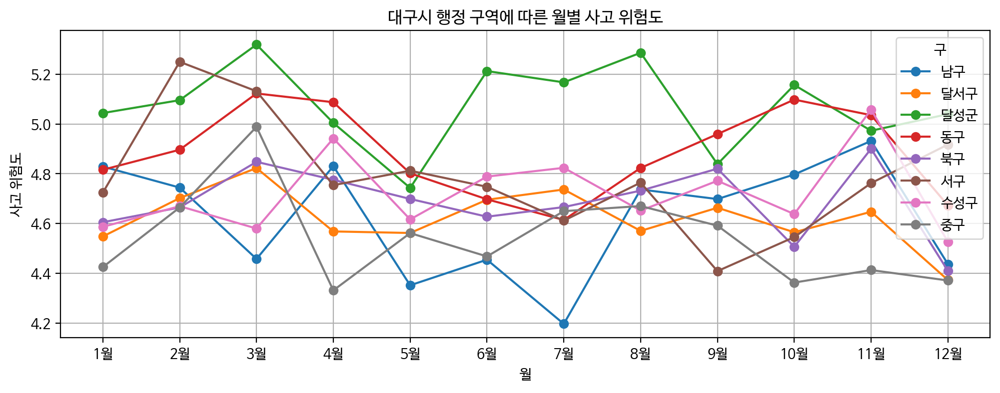

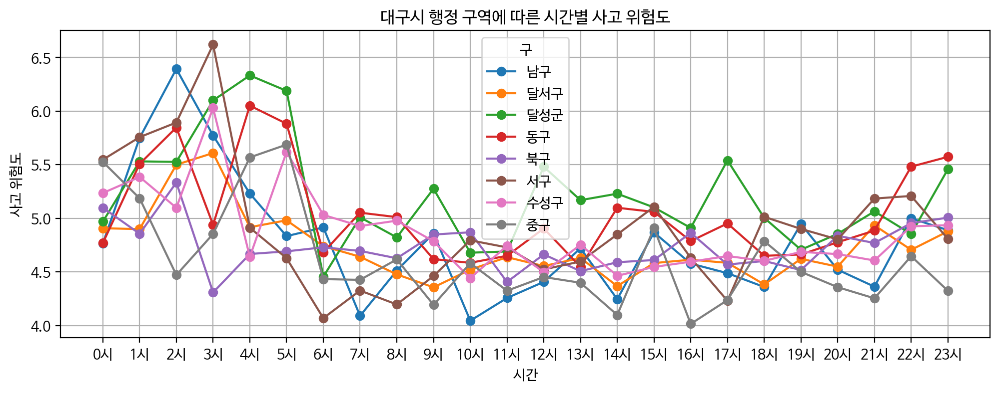

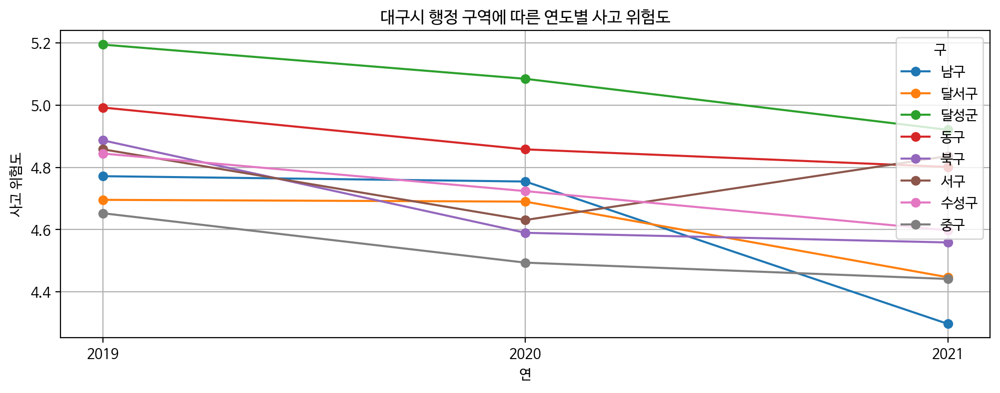

In [ ]:
# 요일별 그래프
weekday_gu_stats = train_df.groupby(['요일','구'])['ECLO'].mean().reset_index()
plt.figure(figsize=(12, 4))

for gu_name in weekday_gu_stats['구'].unique():
    subset = weekday_gu_stats[weekday_gu_stats['구'] == gu_name]
    plt.plot(subset['요일'], subset['ECLO'], marker='o', label=gu_name)

plt.xticks(ticks=range(7), labels=['월요일', '화요일', '수요일', '목요일', '금요일', '토요일', '일요일'])
plt.xlabel('요일')
plt.ylabel('사고 위험도')
plt.title('대구시 행정 구역에 따른 요일별 사고 위험도')
plt.legend(title='Building Type')
plt.grid(True)
plt.show()

# 월별 그래프
month_gu_stats = train_df.groupby(['월', '구'])['ECLO'].mean().reset_index()
plt.figure(figsize=(12, 4))

for gu_name in month_gu_stats['구'].unique():
    subset = month_gu_stats[month_gu_stats['구'] == gu_name]
    plt.plot(subset['월'], subset['ECLO'], marker='o', label=gu_name)

plt.xticks(ticks=range(1, 13), labels=['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월'])
plt.xlabel('월')
plt.ylabel('사고 위험도')
plt.title('대구시 행정 구역에 따른 월별 사고 위험도')
plt.legend(title='구')
plt.grid(True)
plt.show()

# 시간별 그래프
hour_gu_stats = train_df.groupby(['시간', '구'])['ECLO'].mean().reset_index()
plt.figure(figsize=(12, 4))

for gu_name in hour_gu_stats['구'].unique():
    subset = hour_gu_stats[hour_gu_stats['구'] == gu_name]
    plt.plot(subset['시간'], subset['ECLO'], marker='o', label=gu_name)

plt.xticks(ticks=range(24), labels=[f'{hour}시' for hour in range(24)])
plt.xlabel('시간')
plt.ylabel('사고 위험도')
plt.title('대구시 행정 구역에 따른 시간별 사고 위험도')
plt.legend(title='구')
plt.grid(True)
plt.show()

year_gu_stats = train_df.groupby(['연', '구'])['ECLO'].mean().reset_index()
plt.figure(figsize=(12, 4))

for gu_name in year_gu_stats['구'].unique():
    subset = year_gu_stats[year_gu_stats['구'] == gu_name]
    plt.plot(subset['연'], subset['ECLO'], marker='o', label=gu_name)

plt.xticks(ticks=range(2019, 2022), labels=['2019', '2020', '2021'])
plt.xlabel('연')
plt.ylabel('사고 위험도')
plt.title('대구시 행정 구역에 따른 연도별 사고 위험도')
plt.legend(title='구')
plt.grid(True)
plt.show()

In [ ]:
# 각 구에 속하는 동에 대한 요일별 ECLO 평균
weekday_dong_stats = train_df.groupby(['구', '동', '요일'])['ECLO'].mean().reset_index()

# 각 구별로 그래프 그리기
unique_gu_names = weekday_dong_stats['구'].unique()

plt.figure(figsize=(15, 8 * len(unique_gu_names)))

# 각 구에 대한 서브플롯 생성
for i, gu_name in enumerate(unique_gu_names, 1):
    plt.subplot(len(unique_gu_names), 1, i)

    gu_subset = weekday_dong_stats[weekday_dong_stats['구'] == gu_name]

    # 각 동에 대한 선 그래프 그리기
    for dong_name in gu_subset['동'].unique():
        subset = gu_subset[gu_subset['동'] == dong_name]
        plt.plot(subset['요일'], subset['ECLO'], marker='o', label=f'{dong_name}')

    plt.xticks(ticks=range(7), labels=['월요일', '화요일', '수요일', '목요일', '금요일', '토요일', '일요일'])
    plt.xlabel('요일')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 요일별 사고 위험도')
    plt.legend(title='동', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

* '구'별 도로형태1,2의 데이터를 확인한 결과, 큰 이상점은 없음
* ECLO top 10의 '동'에 대한 도로형태1,2에서도 큰 이상점은 없어.
* '구', '동'별 기상상태, 노면상태, 사고유형에서도 이상점 없다
* 달성군은 수요일부터 증가해 토요일에 ECLO가 가장크고, 나머지 구는 금요일에 가장 크다. -> 유독 달성군만 다른 구와 다르게 월, 요일별 트랜드가 나타나는데? 특별한 관광지나 사고다발구역이 있나?
* 모든 구역이 22시부터 증가추세를 보이다가 01~05시에 가장 큰 ECLO를 보인다.
* 유일하게 서구가 연도별로 볼때 2020년보다 2021년에 ECLO 평균이 커진다. 약 0.2정도, '서구'의 월별 그래프를 보면 10월부터 2월까지 ECLO가 증가하는 추세


In [ ]:
month_dong_stats = train_df.groupby(['구', '동', '월'])['ECLO'].mean().reset_index()

unique_gu_names = month_dong_stats['구'].unique()

plt.figure(figsize=(15, 8 * len(unique_gu_names)))

for i, gu_name in enumerate(unique_gu_names, 1):
    plt.subplot(len(unique_gu_names), 1, i)

    gu_subset = month_dong_stats[month_dong_stats['구'] == gu_name]

    for dong_name in gu_subset['동'].unique():
        subset = gu_subset[gu_subset['동'] == dong_name]
        plt.plot(subset['월'], subset['ECLO'], marker='o', label=f'{dong_name}')

    plt.xticks(ticks=range(1, 13), labels=[f'{month}월' for month in range(1, 13)])
    plt.xlabel('월')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 월별 사고 위험도')
    plt.legend(title='동', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
time_dong_stats = train_df.groupby(['구', '동', '시간'])['ECLO'].mean().reset_index()

unique_gu_names = time_dong_stats['구'].unique()

plt.figure(figsize=(15, 8 * len(unique_gu_names)))

for i, gu_name in enumerate(unique_gu_names, 1):
    plt.subplot(len(unique_gu_names), 1, i)

    gu_subset = time_dong_stats[time_dong_stats['구'] == gu_name]

    for dong_name in gu_subset['동'].unique():
        subset = gu_subset[gu_subset['동'] == dong_name]
        plt.plot(subset['시간'], subset['ECLO'], marker='o', label=f'{dong_name}')

    plt.xticks(ticks=range(24), labels=[f'{hour}시' for hour in range(24)])
    plt.xlabel('시간')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 시간별 사고 위험도')
    plt.legend(title='동', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

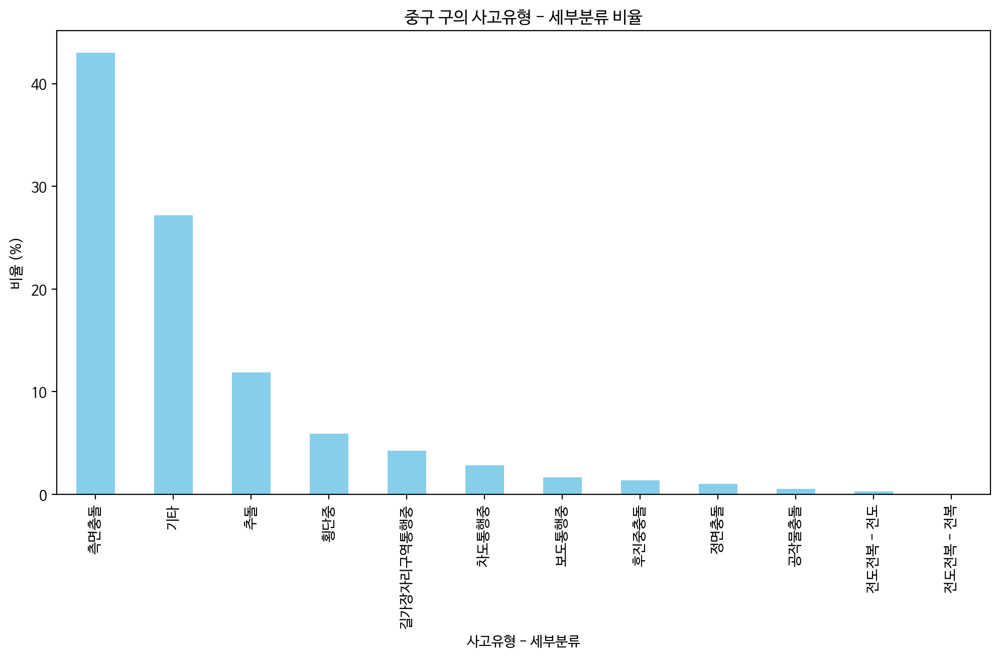

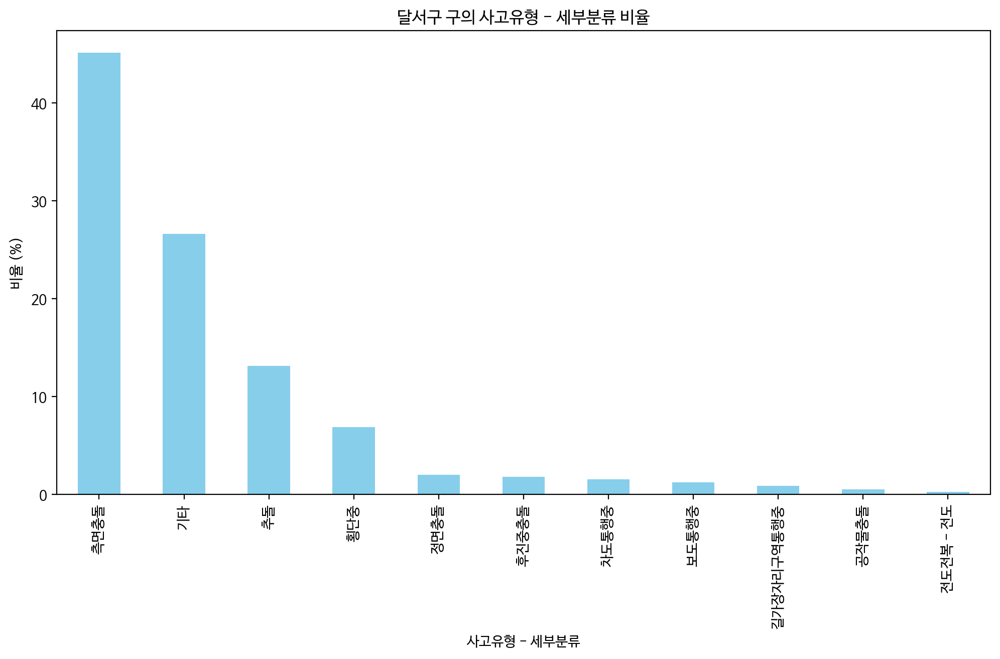

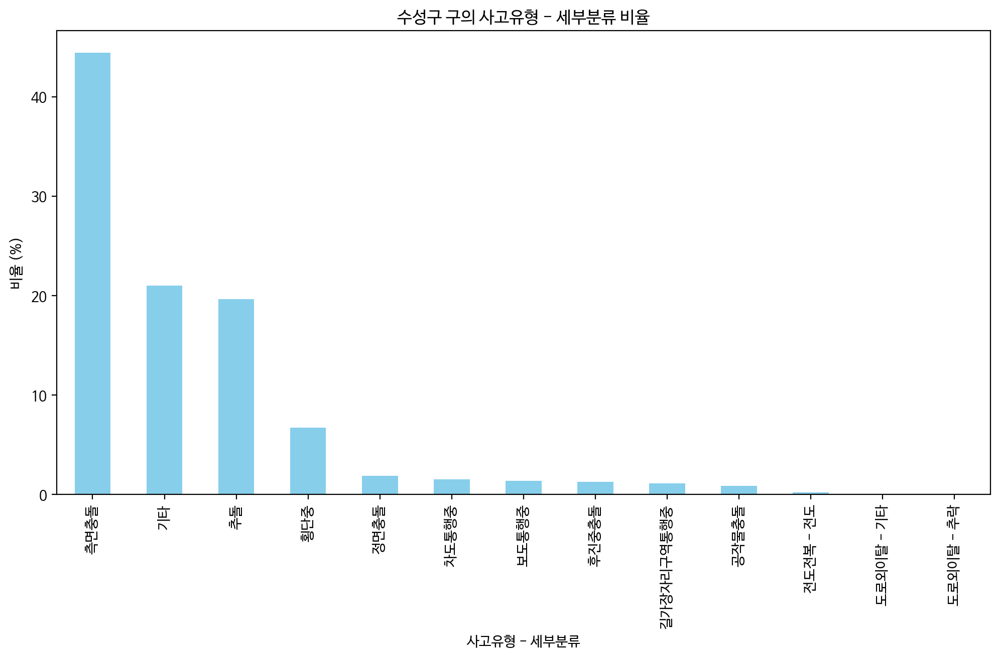

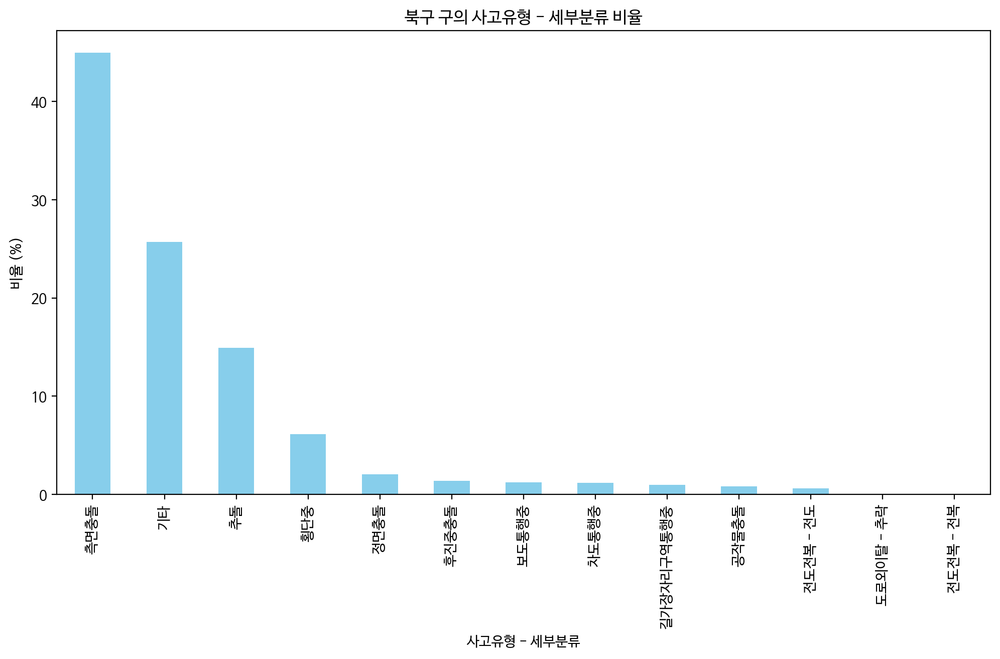

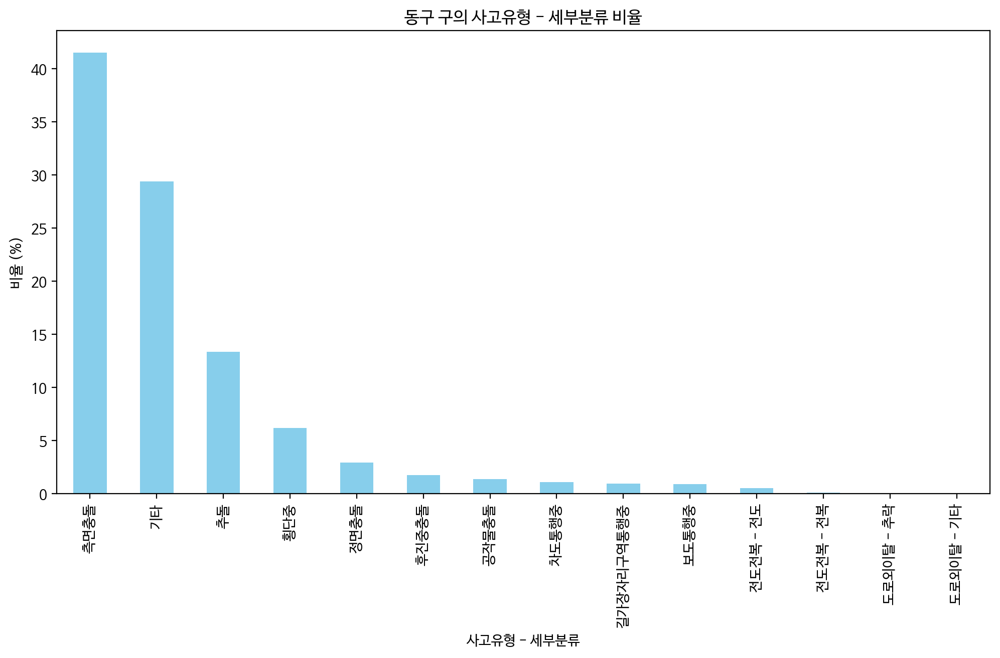

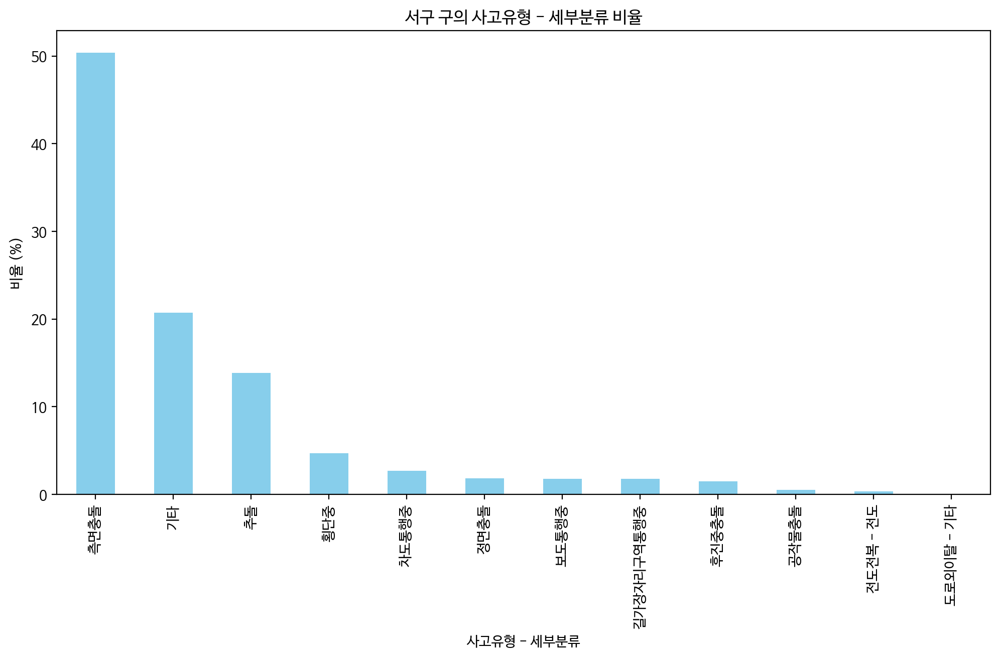

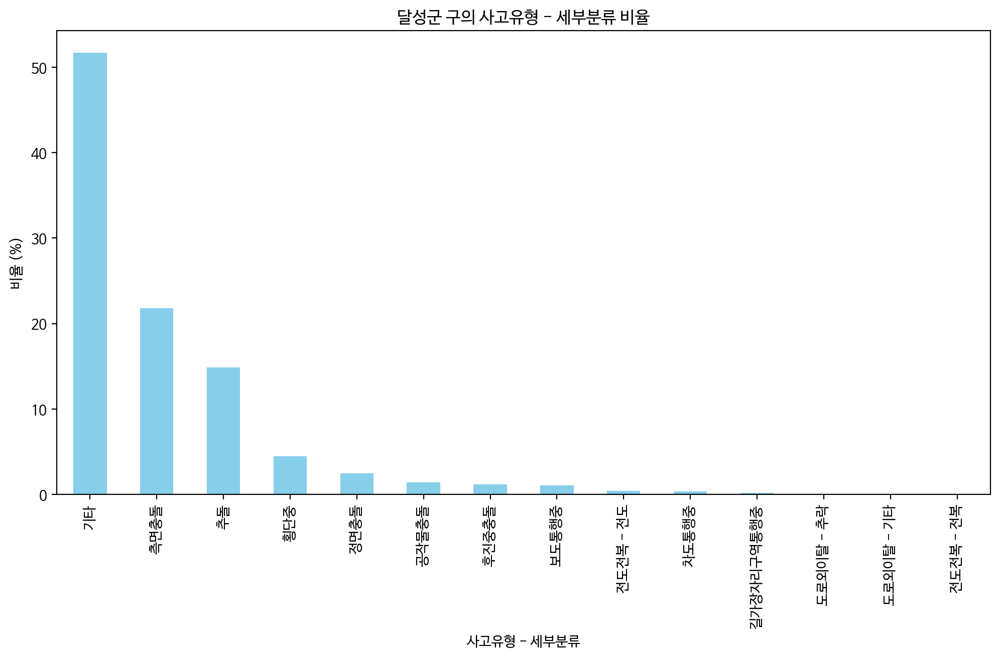

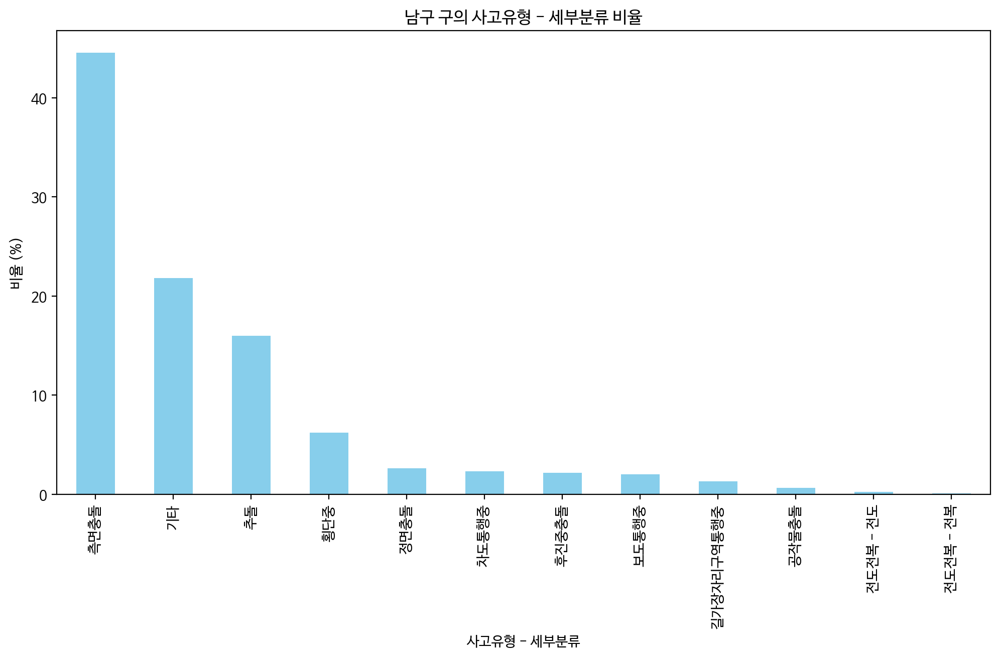

In [ ]:
# 구별로 그래프를 따로 그리기
for gu in train_df['구'].unique():
    gu_data = train_df[train_df['구'] == gu]

    # 각 구별로 '사고유형 - 세부분류'에 있는 데이터의 비율 계산
    accident_subtype_counts = gu_data['사고유형 - 세부분류'].value_counts()
    accident_subtype_ratios = accident_subtype_counts / len(gu_data) * 100

    # 그래프 그리기
    plt.figure(figsize=(12, 6))
    accident_subtype_ratios.plot(kind='bar', color='skyblue')
    plt.title(f'{gu} 구의 사고유형 - 세부분류 비율')
    plt.xlabel('사고유형 - 세부분류')
    plt.ylabel('비율 (%)')
    plt.show()

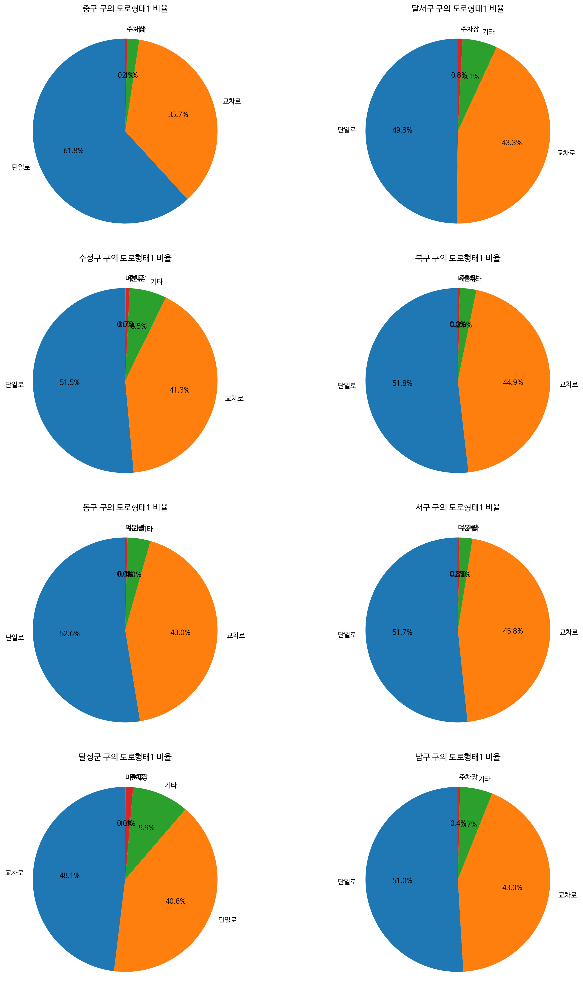

In [ ]:
# 각 구별로 도로형태1에 대한 비율을 그래프로 그리기
unique_gu_list = train_df['구'].unique()
num_cols = 2  # 한 행에 표시할 그래프 개수
num_rows = len(unique_gu_list) // num_cols + (len(unique_gu_list) % num_cols > 0)  # 행 개수 계산

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# 각 구별로 그래프 그리기
for i, gu in enumerate(unique_gu_list):
    row = i // num_cols
    col = i % num_cols
    gu_data = train_df[train_df['구'] == gu]

    # 각 구별로 도로형태1에 대한 비율 계산
    road_type_counts = gu_data['도로형태1'].value_counts()
    road_type_ratios = road_type_counts / len(gu_data) * 100

    # 파이 차트 그리기
    axes[row, col].pie(road_type_ratios, labels=road_type_ratios.index, autopct='%1.1f%%', startangle=90)
    axes[row, col].set_title(f'{gu} 구의 도로형태1 비율')

# 공백 제거
plt.tight_layout()
plt.show()

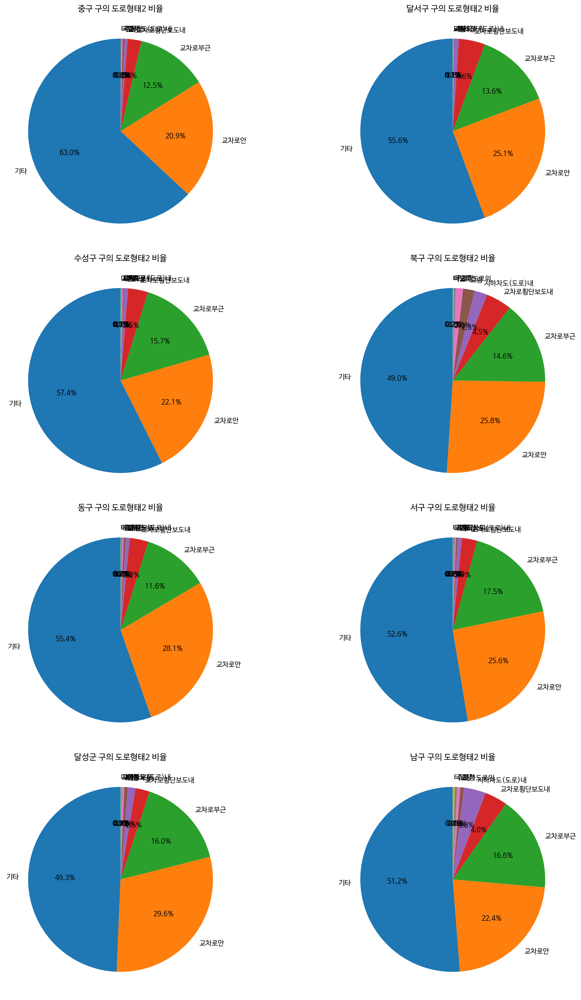

In [ ]:
# 각 구별로 도로형태1에 대한 비율을 그래프로 그리기
unique_gu_list = train_df['구'].unique()
num_cols = 2  # 한 행에 표시할 그래프 개수
num_rows = len(unique_gu_list) // num_cols + (len(unique_gu_list) % num_cols > 0)  # 행 개수 계산

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# 각 구별로 그래프 그리기
for i, gu in enumerate(unique_gu_list):
    row = i // num_cols
    col = i % num_cols
    gu_data = train_df[train_df['구'] == gu]

    # 각 구별로 도로형태1에 대한 비율 계산
    road_type_counts = gu_data['도로형태2'].value_counts()
    road_type_ratios = road_type_counts / len(gu_data) * 100

    # 파이 차트 그리기
    axes[row, col].pie(road_type_ratios, labels=road_type_ratios.index, autopct='%1.1f%%', startangle=90)
    axes[row, col].set_title(f'{gu} 구의 도로형태2 비율')

# 공백 제거
plt.tight_layout()
plt.show()

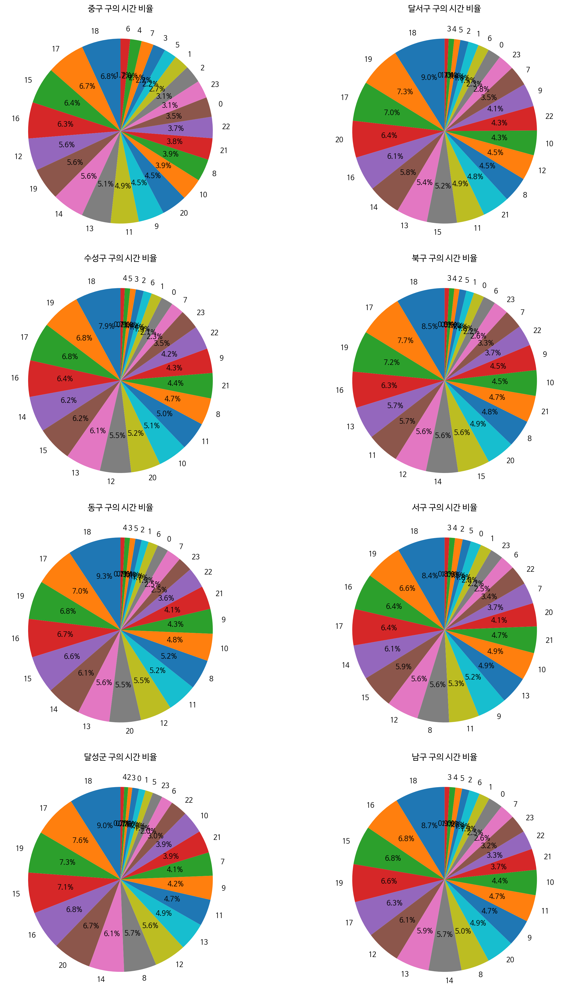

In [ ]:
# 각 구별로 도로형태1에 대한 비율을 그래프로 그리기
unique_gu_list = train_df['구'].unique()
num_cols = 2  # 한 행에 표시할 그래프 개수
num_rows = len(unique_gu_list) // num_cols + (len(unique_gu_list) % num_cols > 0)  # 행 개수 계산

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# 각 구별로 그래프 그리기
for i, gu in enumerate(unique_gu_list):
    row = i // num_cols
    col = i % num_cols
    gu_data = train_df[train_df['구'] == gu]

    # 각 구별로 도로형태1에 대한 비율 계산
    road_type_counts = gu_data['시간'].value_counts()
    road_type_ratios = road_type_counts / len(gu_data) * 100

    # 파이 차트 그리기
    axes[row, col].pie(road_type_ratios, labels=road_type_ratios.index, autopct='%1.1f%%', startangle=90)
    axes[row, col].set_title(f'{gu} 구의 시간 비율')

# 공백 제거
plt.tight_layout()
plt.show()

 * 차량단독사고는 신평동(동구)가 가장 큰 ECLO를 가지고 동구에 속한다.
 * 각 구에 속하는 동별 데이터를 보면 ECLO가 갑작스레 커지는 동이 몇몇 보인다.
 * 앞서 달성군만 다른 양상의 시간별 그래프를 보였는데, 가장 큰 차이는 달성군만  기타-측면출돌-추돌 순의 사고유형을 보이는데, 이는 도로형태1에서 달성군만 교차로에서 사고가 많은것과 연관지을 수 있을것 같다. -> 교차로에서 측면추돌이 많다는 가설을 정립

In [ ]:
location_pattern = r'(\S+) (\S+) (\S+) (\S+)'
light[['도시', '구', '동', '번지']] = light['소재지지번주소'].str.extract(location_pattern)
light_df = light.drop(columns=['소재지지번주소'])

display(cctv_df.head())
display(light_df.head())

NameError: ignored

<Axes: xlabel='경도', ylabel='위도'>

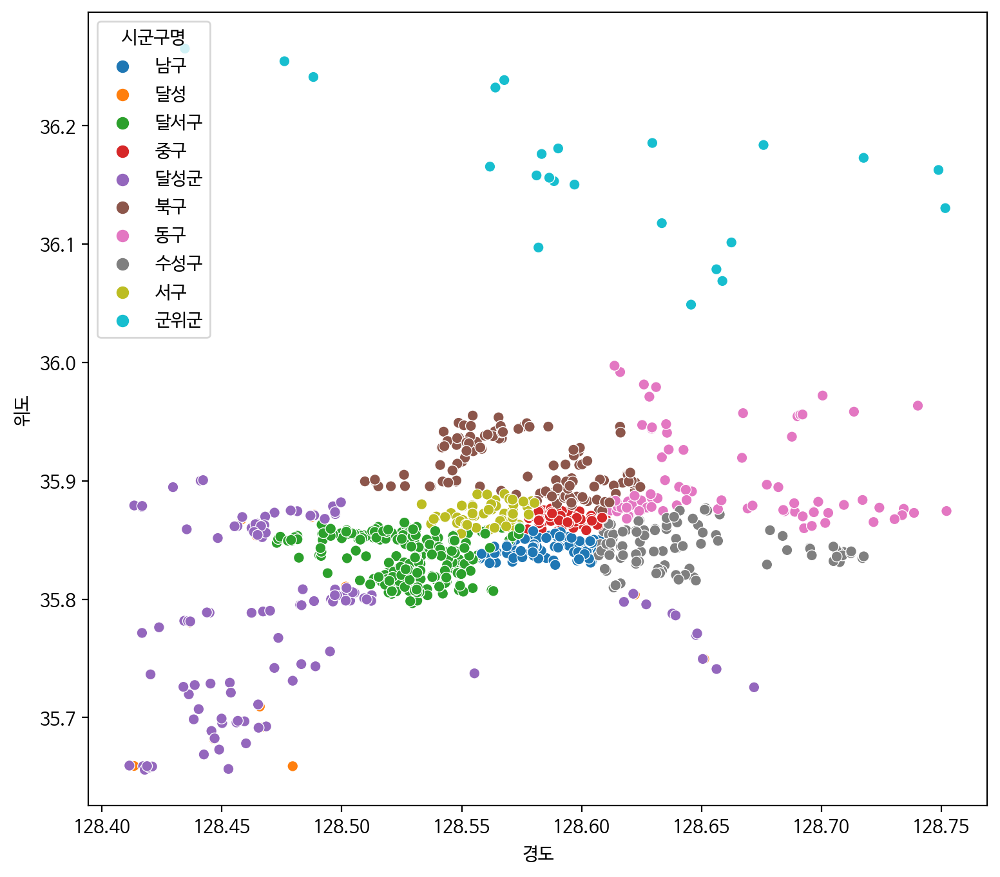

In [ ]:
plt.figure(figsize=(9,8))
sns.scatterplot(data=cctv_df, x="경도", y="위도", hue = "시군구명")

<Axes: xlabel='경도', ylabel='위도'>

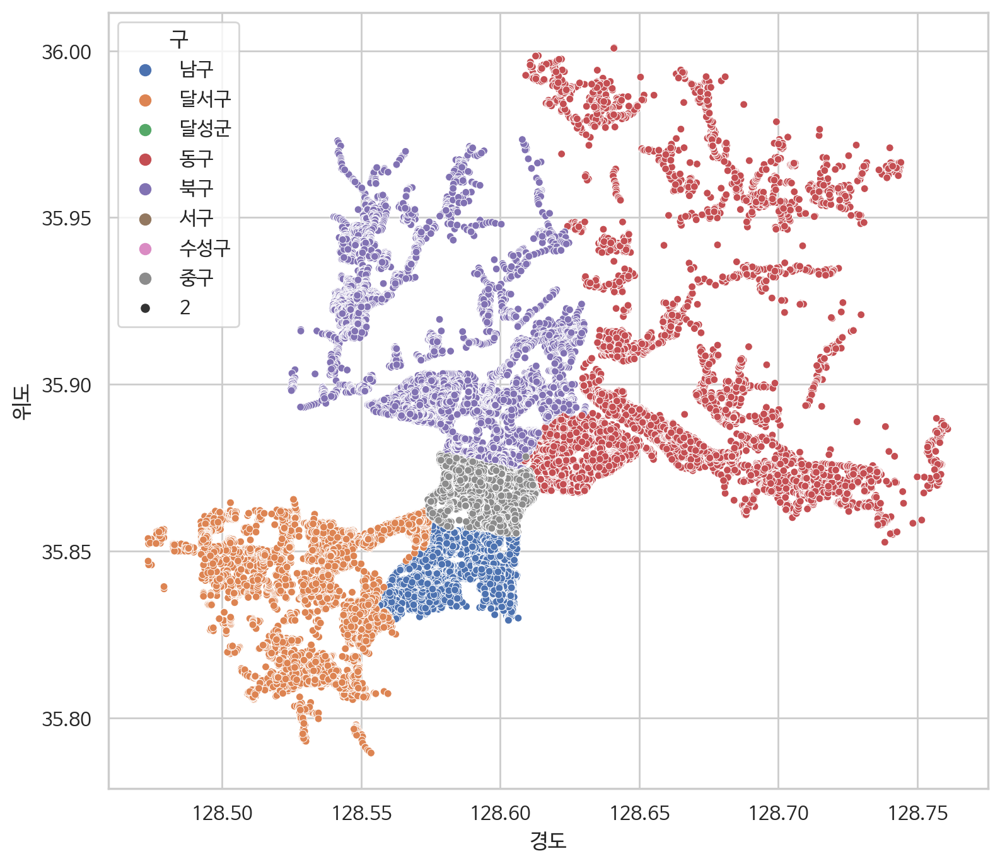

In [ ]:
plt.figure(figsize=(9,8))
sns.scatterplot(data=light_df, x="경도", y="위도", hue="구", size=2)

* cctv는 모든 구에 존재하나, right는 달성군, 서구에는 존재하지 않는다?

In [ ]:
dong_light_count = light_df.groupby('동')['설치개수'].sum().reset_index()
print(dong_light_count)

        동  설치개수
0     가창면  1123
1     각산동   139
2     갈산동   349
3     감삼동   932
4     검단동   391
..    ...   ...
221   화원읍   940
222   화전동    22
223  황금1동   153
224  황금2동   590
225   효목동  1164

[226 rows x 2 columns]


In [ ]:
# train_df에만 있는 '동' 찾기
dongs_only_in_train = set(train_df['동'].unique()) - set(light_df['동'].unique())

# train_df에만 있는 '동' 출력
print("train_df에만 있는 동:")
print(dongs_only_in_train)

train_df에만 있는 동:
{'노변동', '중리동', '지산동', '사수동', '현풍읍', '평리동', '범어동', '상리동', '황금동', '옥포읍', '시지동', '원대동1가', '수성동1가', '만촌동', '범물동', '내당동', '이현동', '대흥동', '가천동', '매호동', '수성동4가', '욱수동', '성동', '하서동', '신매동', '연호동', '수성동3가', '수성동2가', '원대동3가', '비산동', '고모동', '원대동2가', '사월동'}


In [ ]:
display(train_df.head())
display(cctv_df.head())
display(light_df.head())
display(child.head())

,요일,기상상태,노면상태,사고유형,사고유형 - 세부분류,법규위반,가해운전자 차종,가해운전자 성별,가해운전자 연령,가해운전자 상해정도,...,부상자수,ECLO,연,월,일,시간,구,동,도로형태1,도로형태2
0,화요일,맑음,건조,차대사람,길가장자리구역통행중,안전운전불이행,승용,여,51세,상해없음,...,0,5,2019,1,1,0,중구,대신동,단일로,기타
1,화요일,흐림,건조,차대사람,보도통행중,기타,승용,남,39세,상해없음,...,0,3,2019,1,1,0,달서구,감삼동,단일로,기타
2,화요일,맑음,건조,차대사람,차도통행중,안전운전불이행,승용,남,70세,상해없음,...,0,3,2019,1,1,1,수성구,두산동,단일로,기타
3,화요일,맑음,건조,차대차,추돌,안전운전불이행,승용,남,49세,상해없음,...,0,5,2019,1,1,2,북구,복현동,단일로,기타
4,화요일,맑음,건조,차대차,추돌,안전운전불이행,승용,남,30세,상해없음,...,0,3,2019,1,1,4,동구,신암동,단일로,기타


,무인교통단속카메라관리번호,시도명,시군구명,도로종류,도로노선번호,도로노선명,도로노선방향,소재지도로명주소,소재지지번주소,위도,경도,설치장소,단속구분,제한속도,단속구간위치구분,과속단속구간길이,보호구역구분,설치연도
0,주차12,대구광역시,남구,시도,NaN,대명로,3,대구광역시 남구 대명로 162,대구광역시 남구 대명동 903-13,35.838857,128.575418,안지랑네거리1 버스정류장,4,0,NaN,NaN,99.0,2010.0
1,주차13,대구광역시,남구,시도,NaN,봉덕로,3,대구광역시 남구 봉덕로 135,대구광역시 남구 봉덕동 853-8,35.844653,128.604619,효성백년가약,4,0,NaN,NaN,99.0,2013.0
2,주차14,대구광역시,남구,시도,NaN,대봉로,3,대구광역시 남구 봉덕로 134,대구광역시 남구 봉덕동 866-46,35.844183,128.604815,강변코오롱하늘채,4,0,NaN,NaN,99.0,2013.0
3,주차15,대구광역시,남구,시도,NaN,큰골길,3,대구광역시 남구 큰골길 200,대구광역시 남구 대명동 2680-17,35.834798,128.585284,보성청록타운,4,0,NaN,NaN,99.0,2014.0
4,주차16,대구광역시,남구,시도,NaN,큰골길,3,대구광역시 남구 큰골길 243,대구광역시 남구 봉덕동 1616,35.832728,128.588324,환경차고지,4,0,NaN,NaN,99.0,2014.0


,보안등위치명,설치개수,소재지도로명주소,위도,경도,설치연도,설치형태,도시,구,동,번지
0,대명1동1,1,대구광역시 남구 현충로 155,35.846703,128.579803,2016.0,한전주,대구광역시,남구,대명동,1722-4
1,대명1동2,1,대구광역시 남구 현충로31길 10-1,35.846863,128.579406,2016.0,한전주,대구광역시,남구,대명동,1723-11
2,대명1동3,1,대구광역시 남구 현충로31길 9-8,35.846341,128.579342,2017.0,건축물,대구광역시,남구,대명동,1722-56
3,대명1동4,2,대구광역시 남구 현충로31길 19-11,35.846368,128.578922,2016.0,한전주,대구광역시,남구,대명동,1722-41
4,대명1동5,1,대구광역시 남구 현충로29길 22-2,35.845995,128.578858,2016.0,한전주,대구광역시,남구,대명동,1721-22


,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
0,초등학교,남도초등학교,대구광역시 남구 현충동길 74(대명동),대구광역시 남구 대명동 1709,35.845027,128.581402,대구광역시,남부경찰서,Y,7.0,6~8,2020-03-23
1,초등학교,영선초등학교,대구광역시 남구 영선길96(이천동),대구광역시 남구 이천동 477,35.852901,128.596014,대구광역시,남부경찰서,Y,8.0,6~10,2020-03-23
2,초등학교,성명초등학교,대구광역시 남구 성당로 30길 55(대명동),대구광역시 남구 대명동 3050,35.845152,128.570825,대구광역시,남부경찰서,Y,14.0,8~12,2020-03-23
3,초등학교,남덕초등학교,대구광역시 남구 앞산순환로 93길 33,대구광역시 남구 대명동 531-1,35.833042,128.573949,대구광역시,남부경찰서,Y,6.0,6~8,2020-03-23
4,초등학교,대명초등학교,대구광역시 남구 대명로 110,대구광역시 남구 대명동 960,35.838869,128.568889,대구광역시,남부경찰서,Y,5.0,6~10,2020-03-23


# 도로형태

In [ ]:
# '도로형태1'에 해당하는 '도로형태2'의 고유값 확인
unique_road_types = train_df.groupby('도로형태1')['도로형태2'].unique()

# 출력
for road_type, unique_values in unique_road_types.items():
    print(f"도로형태1: {road_type} ->  도로형태2 : {unique_values}")

도로형태1: 교차로 ->  도로형태2 : ['교차로안' '교차로횡단보도내' '교차로부근']
도로형태1: 기타 ->  도로형태2 : ['기타1']
도로형태1: 단일로 ->  도로형태2 : ['기타2' '터널' '지하차도(도로)내' '교량' '고가도로위']
도로형태1: 미분류 ->  도로형태2 : ['미분류']
도로형태1: 주차장 ->  도로형태2 : ['주차장']


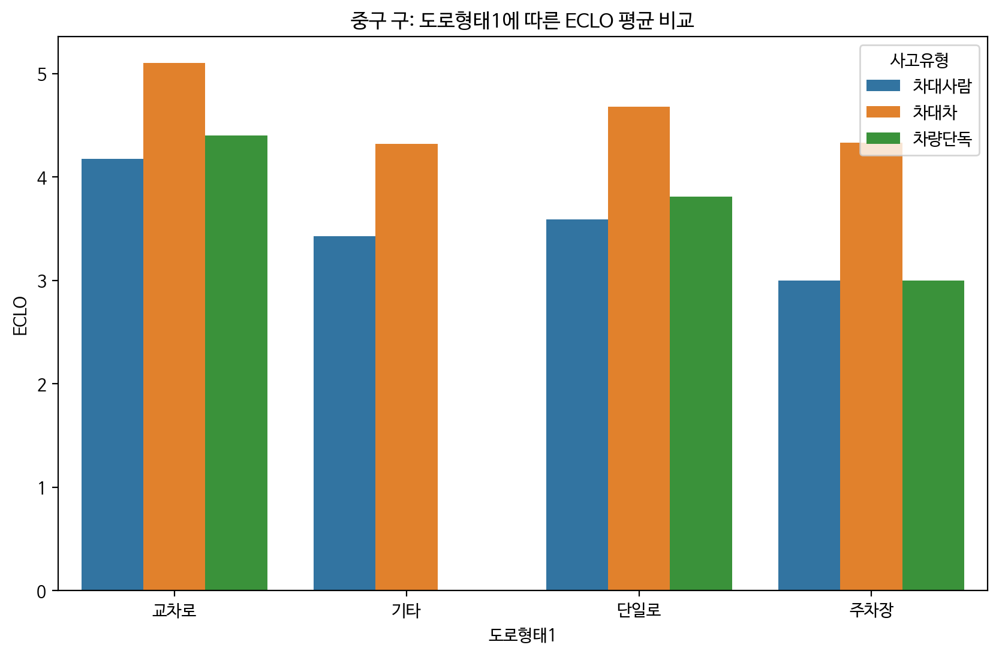

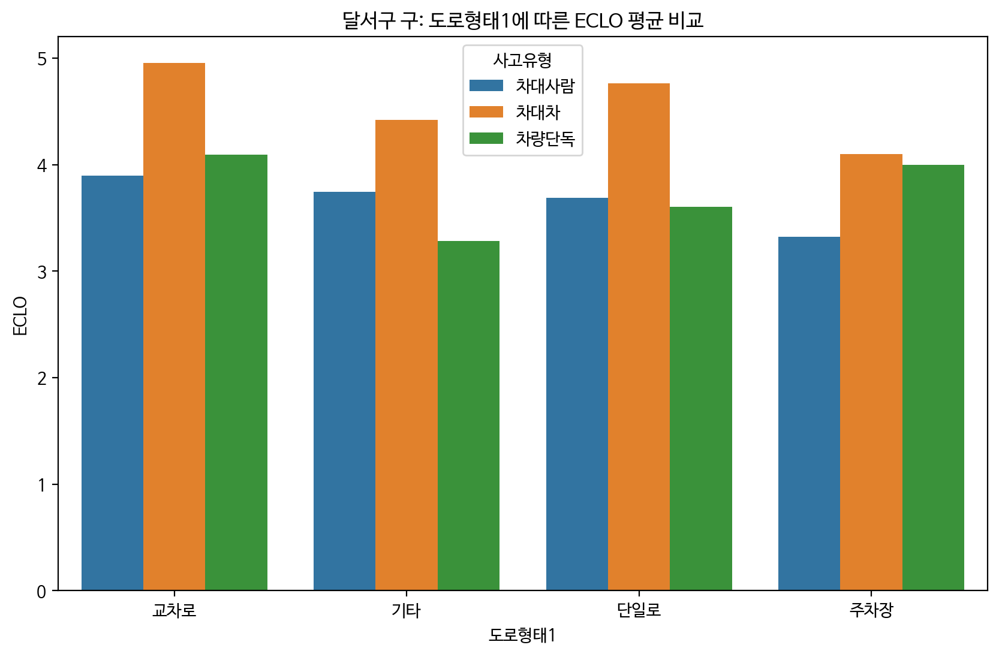

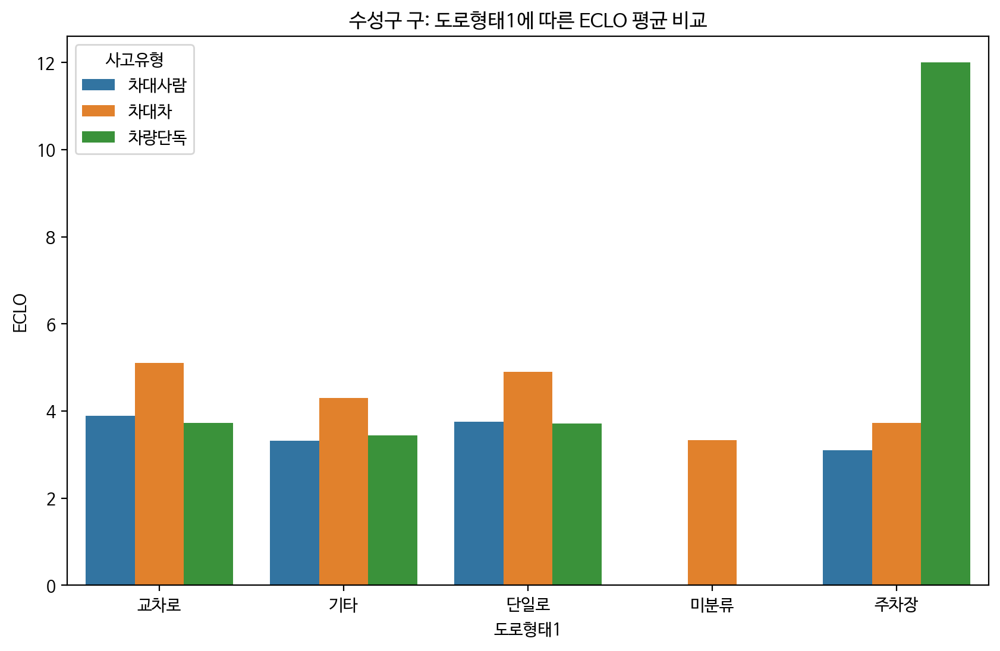

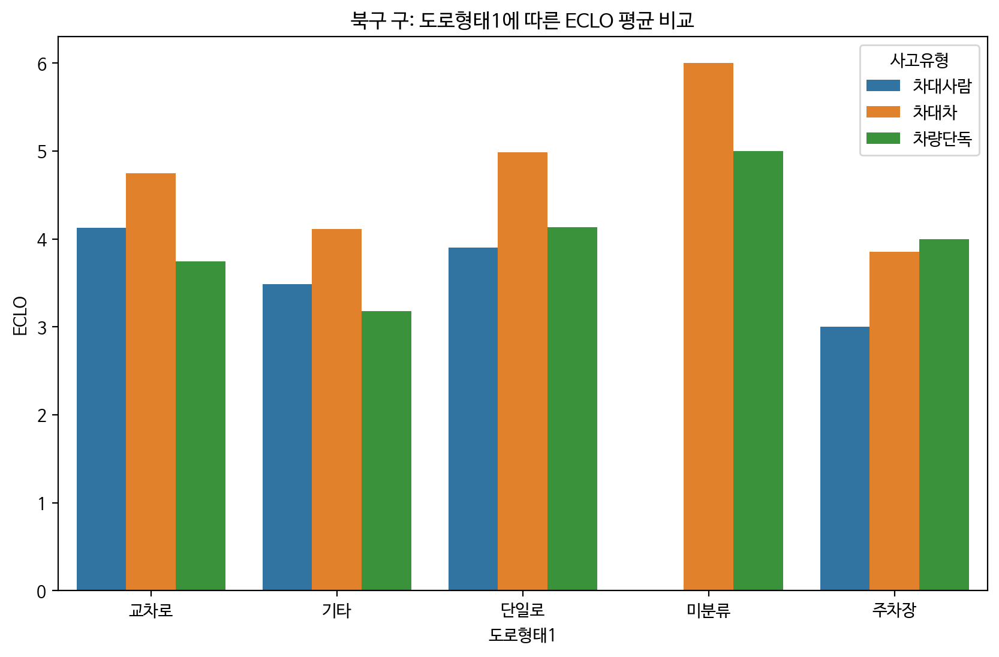

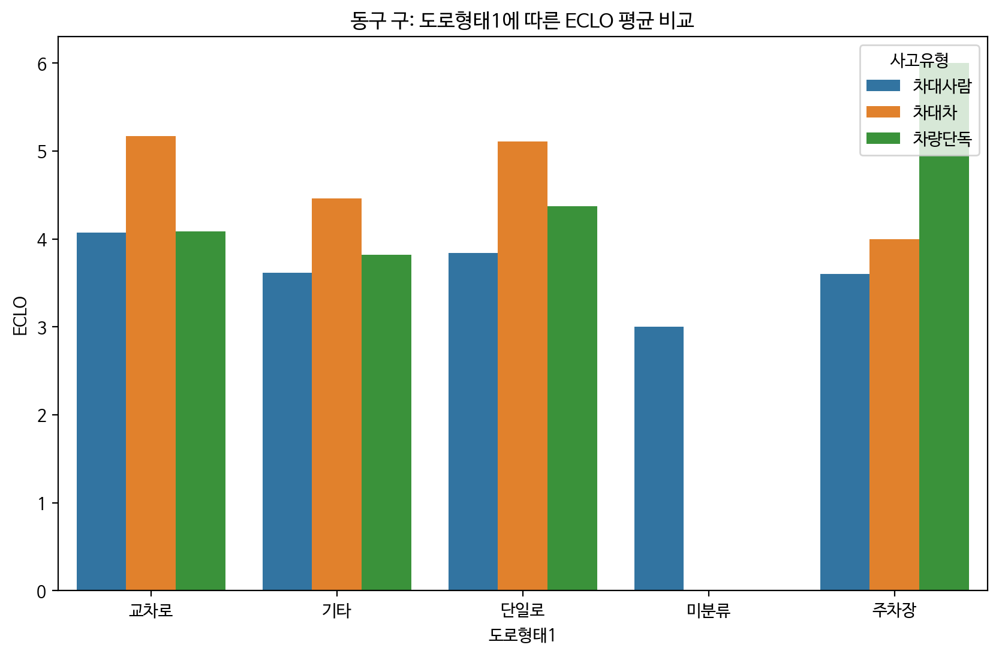

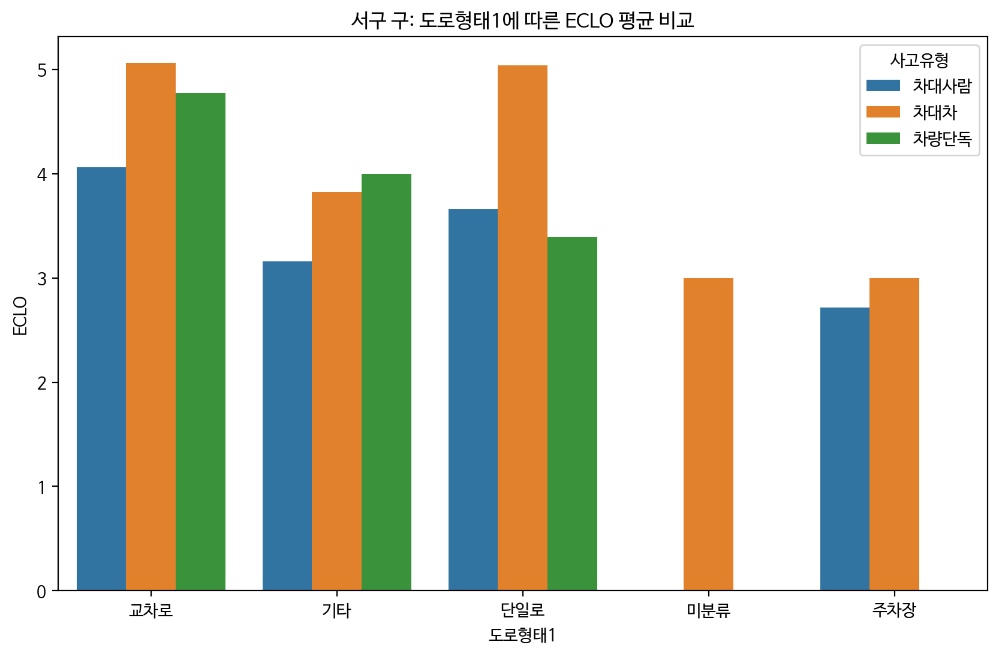

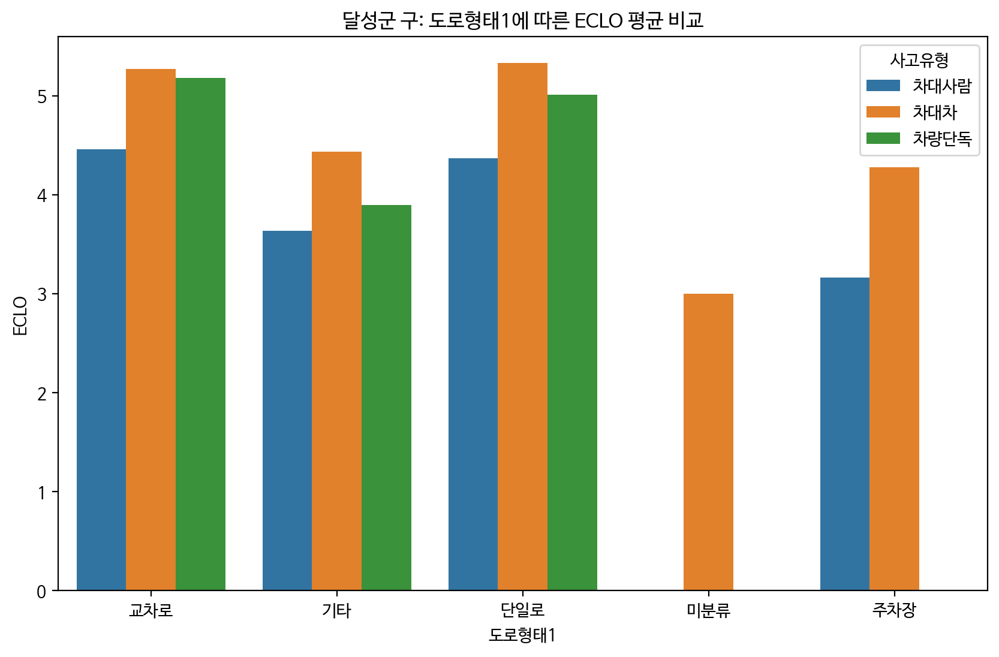

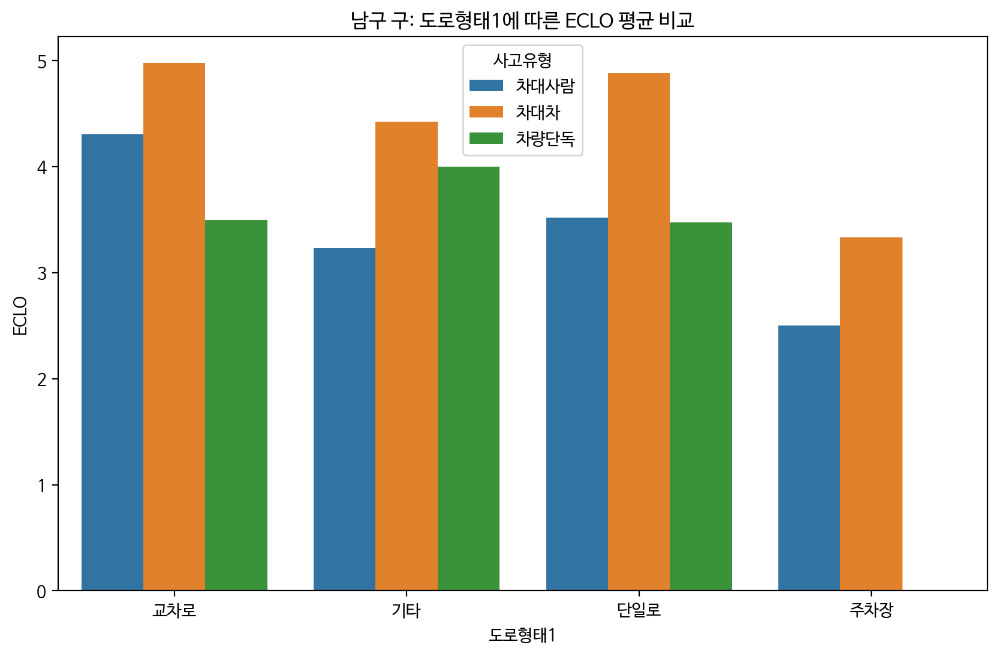

In [ ]:
# '구' 칼럼의 고유값들을 가져옵니다.
gu_list = train_df['구'].unique()

# 고유 '구' 값들에 대해 각각의 그래프를 그립니다.
for gu in gu_list:
    gu_data = train_df[train_df['구'] == gu]

    plt.figure(figsize=(10, 6))
    sns.barplot(x='도로형태1', y='ECLO', hue='사고유형', data=gu_data.groupby(['도로형태1', '사고유형']).mean().reset_index())
    plt.title(f'{gu} 구: 도로형태1에 따른 ECLO 평균 비교')
    plt.show()

* 수성구, 북구, 동구 주차장에서 차량단독 ECLO가 높다?

In [ ]:
# 구별로 그래프 그리기
for gu_name in train_df['구'].unique():
    filtered_train_df = train_df[train_df['구'] == gu_name]

    # 요일별 그래프
    weekday_gu_stats = filtered_train_df.groupby(['요일', '도로형태1'])['ECLO'].mean().reset_index()
    plt.figure(figsize=(12, 4))

    for road_type in weekday_gu_stats['도로형태1'].unique():
        subset = weekday_gu_stats[weekday_gu_stats['도로형태1'] == road_type]
        plt.plot(subset['요일'], subset['ECLO'], marker='o', label=road_type)

    plt.xticks(ticks=range(7), labels=['월요일', '화요일', '수요일', '목요일', '금요일', '토요일', '일요일'])
    plt.xlabel('요일')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 도로형태1별 요일별 사고 위험도')
    plt.legend(title='도로형태1')
    plt.grid(True)
    plt.show()

    # 월별 그래프
    month_gu_stats = filtered_train_df.groupby(['월', '도로형태1'])['ECLO'].mean().reset_index()
    plt.figure(figsize=(12, 4))

    for road_type in month_gu_stats['도로형태1'].unique():
        subset = month_gu_stats[month_gu_stats['도로형태1'] == road_type]
        plt.plot(subset['월'], subset['ECLO'], marker='o', label=road_type)

    plt.xticks(ticks=range(1, 13), labels=['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월'])
    plt.xlabel('월')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 도로형태1별 월별 사고 위험도')
    plt.legend(title='도로형태1')
    plt.grid(True)
    plt.show()

    # 시간별 그래프
    hour_gu_stats = filtered_train_df.groupby(['시간', '도로형태1'])['ECLO'].mean().reset_index()
    plt.figure(figsize=(12, 4))

    for road_type in hour_gu_stats['도로형태1'].unique():
        subset = hour_gu_stats[hour_gu_stats['도로형태1'] == road_type]
        plt.plot(subset['시간'], subset['ECLO'], marker='o', label=road_type)

    plt.xticks(ticks=range(24), labels=[f'{hour}시' for hour in range(24)])
    plt.xlabel('시간')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 도로형태1별 시간별 사고 위험도')
    plt.legend(title='도로형태1')
    plt.grid(True)
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 구별로 그래프 그리기
for gu_name in train_df['구'].unique():
    filtered_train_df = train_df[train_df['구'] == gu_name]

    # 요일별 그래프
    weekday_gu_stats = filtered_train_df.groupby(['요일', '도로형태2'])['ECLO'].mean().reset_index()
    plt.figure(figsize=(12, 4))

    for road_type in weekday_gu_stats['도로형태2'].unique():
        subset = weekday_gu_stats[weekday_gu_stats['도로형태2'] == road_type]
        plt.plot(subset['요일'], subset['ECLO'], marker='o', label=road_type)

    plt.xticks(ticks=range(7), labels=['월요일', '화요일', '수요일', '목요일', '금요일', '토요일', '일요일'])
    plt.xlabel('요일')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 도로형태2별 요일별 사고 위험도')
    plt.legend(title='도로형태2')
    plt.grid(True)
    plt.show()

    # 월별 그래프
    month_gu_stats = filtered_train_df.groupby(['월', '도로형태2'])['ECLO'].mean().reset_index()
    plt.figure(figsize=(12, 4))

    for road_type in month_gu_stats['도로형태2'].unique():
        subset = month_gu_stats[month_gu_stats['도로형태2'] == road_type]
        plt.plot(subset['월'], subset['ECLO'], marker='o', label=road_type)

    plt.xticks(ticks=range(1, 13), labels=['1월', '2월', '3월', '4월', '5월', '6월', '7월', '8월', '9월', '10월', '11월', '12월'])
    plt.xlabel('월')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 도로형태2별 월별 사고 위험도')
    plt.legend(title='도로형태2')
    plt.grid(True)
    plt.show()

    # 시간별 그래프
    hour_gu_stats = filtered_train_df.groupby(['시간', '도로형태2'])['ECLO'].mean().reset_index()
    plt.figure(figsize=(12, 4))

    for road_type in hour_gu_stats['도로형태2'].unique():
        subset = hour_gu_stats[hour_gu_stats['도로형태2'] == road_type]
        plt.plot(subset['시간'], subset['ECLO'], marker='o', label=road_type)

    plt.xticks(ticks=range(24), labels=[f'{hour}시' for hour in range(24)])
    plt.xlabel('시간')
    plt.ylabel('사고 위험도')
    plt.title(f'{gu_name}에 따른 도로형태2별 시간별 사고 위험도')
    plt.legend(title='도로형태2')
    plt.grid(True)
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 구별로 그래프 그리기
for gu_name in train_df['구'].unique():
    filtered_train_df = train_df[train_df['구'] == gu_name]

    # 각 구에서 도로형태2별로 그룹화
    for road_type in filtered_train_df['도로형태2'].unique():
        subset_df = filtered_train_df[filtered_train_df['도로형태2'] == road_type]

        # 시간별 그래프
        hour_road_type_stats = subset_df.groupby(['시간', '동'])['ECLO'].mean().reset_index()
        plt.figure(figsize=(12, 4))

        for dong_name in hour_road_type_stats['동'].unique():
            subset = hour_road_type_stats[hour_road_type_stats['동'] == dong_name]
            plt.plot(subset['시간'], subset['ECLO'], marker='o', label=dong_name)

        plt.xticks(ticks=range(24), labels=[f'{hour}시' for hour in range(24)])
        plt.xlabel('시간')
        plt.ylabel('사고 위험도')
        plt.title(f'{gu_name} {road_type}에 따른 동별 시간별 사고 위험도')
        plt.legend(title='동')
        plt.grid(True)
        plt.show()

Output hidden; open in https://colab.research.google.com to view.

# 나이

* 어린이 보호구역 이용하자. -> train과 test에 어린이 보호구역일 확률을 넣어보자

In [ ]:
location_pattern = r'(\S+) (\S+) (\S+) (\S+)'
child[['도시', '구', '동', '번지']] = child['소재지지번주소'].str.extract(location_pattern)
child_df = child.drop(columns=['소재지지번주소'])

In [ ]:
# 어린이보호구역 개수 구하기
dong_counts = child_df['동'].value_counts()

# train_df에 '어린이보호구역 개수' 칼럼 추가
train_df['어린이보호구역 개수'] = train_df['동'].map(dong_counts).fillna(0).astype(int)

In [ ]:
#변수형 변경
import re
def extract_and_convert_to_int(data):
    numbers = re.findall(r'\d+', str(data))
    return int(numbers[0]) if numbers else np.nan

train_df['가해운전자 연령'] = train_df['가해운전자 연령'].apply(extract_and_convert_to_int)
train_df['피해운전자 연령'] = train_df['피해운전자 연령'].apply(extract_and_convert_to_int)

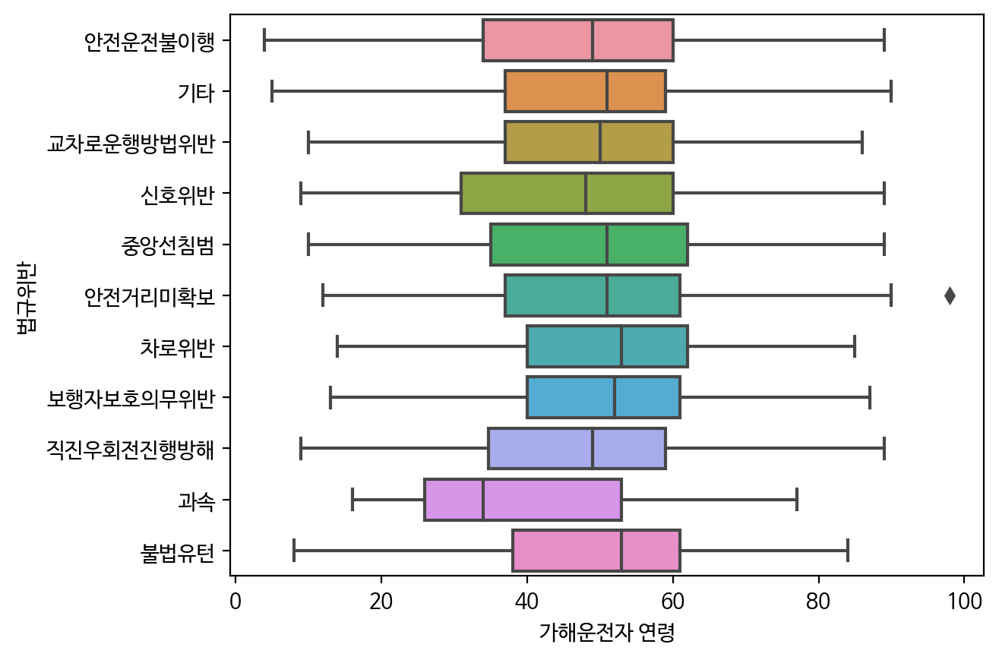

In [ ]:
sns.boxplot(data=train_df, y='법규위반', x='가해운전자 연령')
plt.show()

* 젊은 20대 쪽에서 과속이 많다. 앞서 과속이 가장 큰 ECLO의 양상을 보였는데

# CCTV

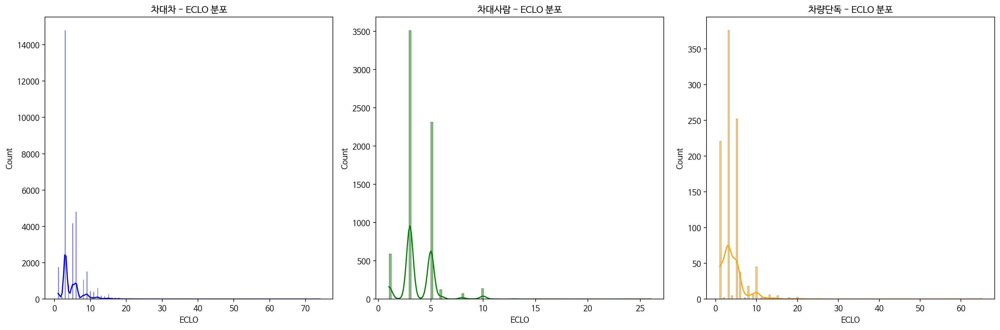

In [ ]:
# 각 사고유형에 따라 데이터프레임 나누기
car_to_car_df = train_df[train_df['사고유형'] == '차대차']
car_to_person_df = train_df[train_df['사고유형'] == '차대사람']
vehicle_alone_df = train_df[train_df['사고유형'] == '차량단독']

# 데이터프레임별 ECLO의 양상 확인
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# 차대차
sns.histplot(car_to_car_df['ECLO'], kde=True, color='blue', ax=axes[0])
axes[0].set_title('차대차 - ECLO 분포')

# 차대사람
sns.histplot(car_to_person_df['ECLO'], kde=True, color='green', ax=axes[1])
axes[1].set_title('차대사람 - ECLO 분포')

# 차량단독
sns.histplot(vehicle_alone_df['ECLO'], kde=True, color='orange', ax=axes[2])
axes[2].set_title('차량단독 - ECLO 분포')

plt.tight_layout()
plt.show()


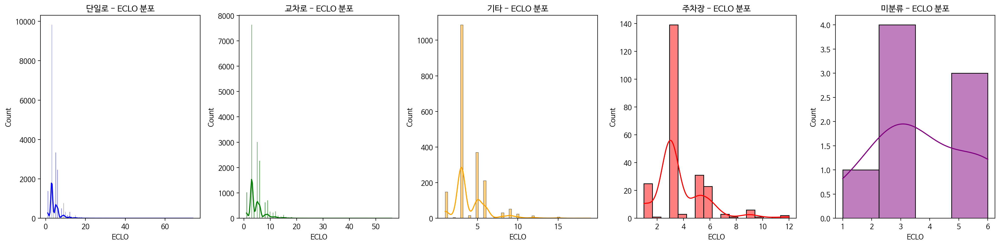

In [ ]:
# 각 도로형태에 따라 데이터프레임 나누기
single_road_df = train_df[train_df['도로형태1'] == '단일로']
intersection_df = train_df[train_df['도로형태1'] == '교차로']
other_road_df = train_df[train_df['도로형태1'] == '기타']
parking_df = train_df[train_df['도로형태1'] == '주차장']
unclassified_df = train_df[train_df['도로형태1'] == '미분류']

# 데이터프레임별 ECLO의 양상 확인
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 5))

# 단일로
sns.histplot(single_road_df['ECLO'], kde=True, color='blue', ax=axes[0])
axes[0].set_title('단일로 - ECLO 분포')

# 교차로
sns.histplot(intersection_df['ECLO'], kde=True, color='green', ax=axes[1])
axes[1].set_title('교차로 - ECLO 분포')

# 기타
sns.histplot(other_road_df['ECLO'], kde=True, color='orange', ax=axes[2])
axes[2].set_title('기타 - ECLO 분포')

# 주차장
sns.histplot(parking_df['ECLO'], kde=True, color='red', ax=axes[3])
axes[3].set_title('주차장 - ECLO 분포')

# 미분류
sns.histplot(unclassified_df['ECLO'], kde=True, color='purple', ax=axes[4])
axes[4].set_title('미분류 - ECLO 분포')

plt.tight_layout()
plt.show()


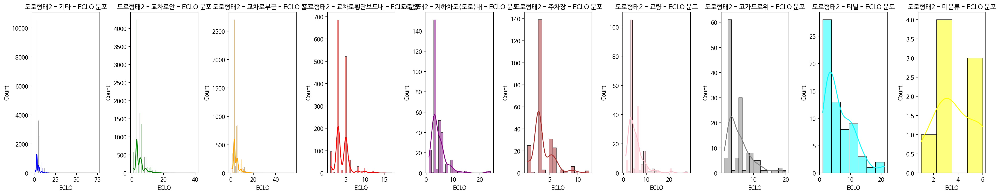

In [ ]:
# 각 도로형태2에 따라 데이터프레임 나누기
road_type2_etc_df = train_df[train_df['도로형태2'] == '기타']
road_type2_intersection_df = train_df[train_df['도로형태2'] == '교차로안']
road_type2_near_intersection_df = train_df[train_df['도로형태2'] == '교차로부근']
road_type2_crosswalk_df = train_df[train_df['도로형태2'] == '교차로횡단보도내']
road_type2_underpass_df = train_df[train_df['도로형태2'] == '지하차도(도로)내']
road_type2_parking_df = train_df[train_df['도로형태2'] == '주차장']
road_type2_bridge_df = train_df[train_df['도로형태2'] == '교량']
road_type2_overpass_df = train_df[train_df['도로형태2'] == '고가도로위']
road_type2_tunnel_df = train_df[train_df['도로형태2'] == '터널']
road_type2_unclassified_df = train_df[train_df['도로형태2'] == '미분류']

# 데이터프레임별 ECLO의 양상 확인
fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(25, 5))

# 기타
sns.histplot(road_type2_etc_df['ECLO'], kde=True, color='blue', ax=axes[0])
axes[0].set_title('도로형태2 - 기타 - ECLO 분포')

# 교차로안
sns.histplot(road_type2_intersection_df['ECLO'], kde=True, color='green', ax=axes[1])
axes[1].set_title('도로형태2 - 교차로안 - ECLO 분포')

# 교차로부근
sns.histplot(road_type2_near_intersection_df['ECLO'], kde=True, color='orange', ax=axes[2])
axes[2].set_title('도로형태2 - 교차로부근 - ECLO 분포')

# 교차로횡단보도내
sns.histplot(road_type2_crosswalk_df['ECLO'], kde=True, color='red', ax=axes[3])
axes[3].set_title('도로형태2 - 교차로횡단보도내 - ECLO 분포')

# 지하차도(도로)내
sns.histplot(road_type2_underpass_df['ECLO'], kde=True, color='purple', ax=axes[4])
axes[4].set_title('도로형태2 - 지하차도(도로)내 - ECLO 분포')

# 주차장
sns.histplot(road_type2_parking_df['ECLO'], kde=True, color='brown', ax=axes[5])
axes[5].set_title('도로형태2 - 주차장 - ECLO 분포')

# 교량
sns.histplot(road_type2_bridge_df['ECLO'], kde=True, color='pink', ax=axes[6])
axes[6].set_title('도로형태2 - 교량 - ECLO 분포')

# 고가도로위
sns.histplot(road_type2_overpass_df['ECLO'], kde=True, color='gray', ax=axes[7])
axes[7].set_title('도로형태2 - 고가도로위 - ECLO 분포')

# 터널
sns.histplot(road_type2_tunnel_df['ECLO'], kde=True, color='cyan', ax=axes[8])
axes[8].set_title('도로형태2 - 터널 - ECLO 분포')

# 미분류
sns.histplot(road_type2_unclassified_df['ECLO'], kde=True, color='yellow', ax=axes[9])
axes[9].set_title('도로형태2 - 미분류 - ECLO 분포')

plt.tight_layout()
plt.show()

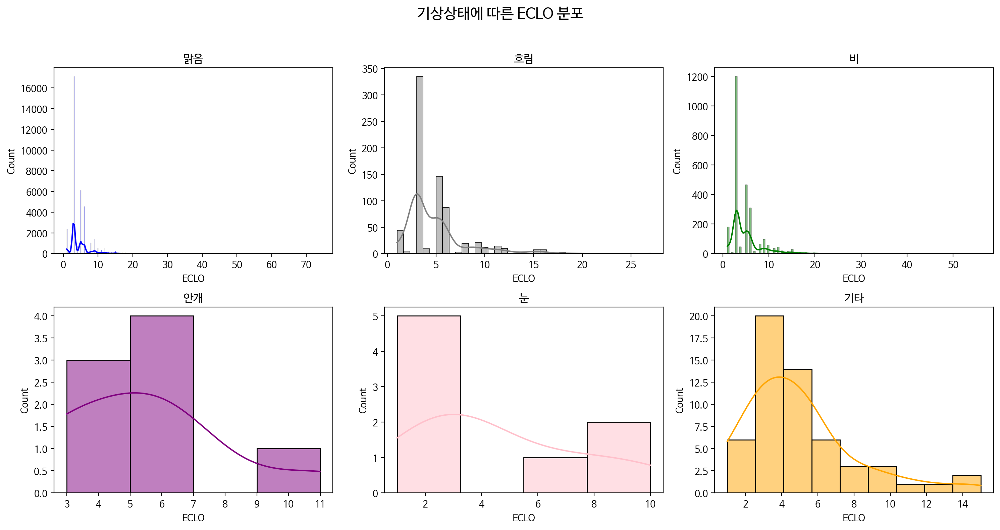

In [ ]:
clear_df = train_df[train_df['기상상태'] == '맑음']
cloudy_df = train_df[train_df['기상상태'] == '흐림']
rainy_df = train_df[train_df['기상상태'] == '비']
foggy_df = train_df[train_df['기상상태'] == '안개']
snowy_df = train_df[train_df['기상상태'] == '눈']
other_df = train_df[train_df['기상상태'] == '기타']

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))

# 맑음
sns.histplot(clear_df['ECLO'], kde=True, color='blue', ax=axes[0, 0])
axes[0, 0].set_title('맑음')

# 흐림
sns.histplot(cloudy_df['ECLO'], kde=True, color='gray', ax=axes[0, 1])
axes[0, 1].set_title('흐림')

# 비
sns.histplot(rainy_df['ECLO'], kde=True, color='green', ax=axes[0, 2])
axes[0, 2].set_title('비')

# 안개
sns.histplot(foggy_df['ECLO'], kde=True, color='purple', ax=axes[1, 0])
axes[1, 0].set_title('안개')

# 눈
sns.histplot(snowy_df['ECLO'], kde=True, color='pink', ax=axes[1, 1])
axes[1, 1].set_title('눈')

# 기타
sns.histplot(other_df['ECLO'], kde=True, color='orange', ax=axes[1, 2])
axes[1, 2].set_title('기타')

plt.suptitle('기상상태에 따른 ECLO 분포', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # 서브플롯 간의 간격 조절
plt.show()
